# Описание проекта (Промышленность)
Чтобы оптимизировать производственные расходы, металлургический комбинат ООО «Стальная птица» решил уменьшить потребление электроэнергии на этапе обработки стали. Ваша задача — построить модель, которая будет предсказывать температуру стали. Найдите лучшую модель прогнозирования последней измеренной температуры. В качестве критерия оценки качества модели используйте метрику MAE.

**Описание этапа обработки**

Сталь обрабатывают в металлическом ковше вместимостью около 100 тонн. Чтобы ковш выдерживал высокие температуры, изнутри его облицовывают огнеупорным кирпичом. Расплавленную сталь заливают в ковш и подогревают до нужной температуры графитовыми электродами. Они установлены в крышке ковша.
Из сплава выводится сера (десульфурация), добавлением примесей корректируется химический состав и отбираются пробы. Сталь легируют — изменяют её состав, добавляя куски сплава из бункера для сыпучих материалов или проволоку через специальный трайб-аппарат.
Перед тем как первый раз ввести легирующие добавки, измеряют температуру стали и производят её химический анализ. Потом температуру на несколько минут повышают, добавляют легирующие материалы и продувают сплав инертным газом. Затем сплав перемешивают и снова проводят измерения. Такой цикл повторяется до тех пор, пока не будет достигнут нужный химический состав сплава и оптимальная температура плавки.
Дальше расплавленная сталь отправляется на доводку металла или поступает в машину непрерывной разливки. Оттуда готовый продукт выходит в виде заготовок-слябов (англ. slab, «плита»).

## Описание данных
Данные хранятся в таблицах в базе данных PostgreSQL:
- steel.data_arc — данные об электродах,
- steel.data_bulk — данные о подаче сыпучих материалов (объём),
- steel.data_bulk_time — данные о подаче сыпучих материалов (время),
- steel.data_gas — данные о продувке сплава газом,
- steel.data_temp — результаты измерения температуры,
- steel.data_wire — данные о проволочных материалах (объём),
- steel.data_wire_time — данные о проволочных материалах (время).

## Импорт модулей

In [1]:
# !pip install shap
# !pip install sweetviz
# !pip install phik

In [2]:
import pandas as pd
from sqlalchemy import create_engine
import matplotlib.pyplot as plt

from datetime import datetime
from functools import reduce

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neural_network import MLPRegressor

import sweetviz as sv
import shap
from phik.report import plot_correlation_matrix


## Константы

In [3]:
SEED = 123
SCORE = "neg_mean_absolute_error"
N_ITER = 500


## Подключение к базе SQL

In [4]:
db_config = {
'user': 'praktikum_student', # имя пользователя,
'pwd': 'Sdf4$2;d-d30pp', # пароль,
'host': 'rc1b-wcoijxj3yxfsf3fs.mdb.yandexcloud.net',
'port': 6432, # порт подключения,
'db': 'data-science-final' # название базы данных,
}

connection_string = 'postgresql://{}:{}@{}:{}/{}'.format(
    db_config['user'],
    db_config['pwd'],
    db_config['host'],
    db_config['port'],
    db_config['db'],
)

engine = create_engine(connection_string)


## Первичное исследование таблиц

In [5]:
for table in ["steel.data_temp", "steel.data_arc", "steel.data_bulk", "steel.data_bulk_time",
              "steel.data_wire", "steel.data_wire_time", "steel.data_gas"]:
    query = f'''
    SELECT *
    FROM {table}
    LIMIT 5;
    '''
    print(f'Таблица {table[table.index(".") + 1:]}')
    display(pd.read_sql_query(query, con=engine))


Таблица data_temp


,key,MesaureTime,Temperature
0,1,11:16:18,1571.0
1,1,11:25:53,1604.0
2,1,11:29:11,1618.0
3,1,11:30:01,1601.0
4,1,11:30:39,1613.0


Таблица data_arc


,key,BeginHeat,EndHeat,ActivePower,ReactivePower
0,1,11:02:14,11:06:02,0.976059,0.687084
1,1,11:07:28,11:10:33,0.805607,0.520285
2,1,11:11:44,11:14:36,0.744363,0.498805
3,1,11:18:14,11:24:19,1.659363,1.062669
4,1,11:26:09,11:28:37,0.692755,0.414397


Таблица data_bulk


,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,None,None,None,43.0,None,None,None,None,None,None,None,206.0,None,150.0,154.0
1,2,None,None,None,73.0,None,None,None,None,None,None,None,206.0,None,149.0,154.0
2,3,None,None,None,34.0,None,None,None,None,None,None,None,205.0,None,152.0,153.0
3,4,None,None,None,81.0,None,None,None,None,None,None,None,207.0,None,153.0,154.0
4,5,None,None,None,78.0,None,None,None,None,None,None,None,203.0,None,151.0,152.0


Таблица data_bulk_time


,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,None,None,None,11:21:30,None,None,None,None,None,None,None,11:03:52,None,11:03:52,11:03:52
1,2,None,None,None,11:46:38,None,None,None,None,None,None,None,11:40:20,None,11:40:20,11:40:20
2,3,None,None,None,12:31:06,None,None,None,None,None,None,None,12:09:40,None,12:09:40,12:09:40
3,4,None,None,None,12:48:43,None,None,None,None,None,None,None,12:41:24,None,12:41:24,12:41:24
4,5,None,None,None,13:18:50,None,None,None,None,None,None,None,13:12:56,None,13:12:56,13:12:56


Таблица data_wire


,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,60.059998,NaN,None,None,None,None,None,None,None
1,2,96.052315,NaN,None,None,None,None,None,None,None
2,3,91.160157,NaN,None,None,None,None,None,None,None
3,4,89.063515,NaN,None,None,None,None,None,None,None
4,5,89.238236,9.11456,None,None,None,None,None,None,None


Таблица data_wire_time


,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,11:11:41,None,None,None,None,None,None,None,None
1,2,11:46:10,None,None,None,None,None,None,None,None
2,3,12:13:47,None,None,None,None,None,None,None,None
3,4,12:48:05,None,None,None,None,None,None,None,None
4,5,13:18:15,13:32:06,None,None,None,None,None,None,None


Таблица data_gas


,key,gas
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692


Можно видеть, что таблицы соответствуют условию задачи и имеют ключ для связи. При производстве стали нагрев происходит ступенчатым образом, для того чтобы объединить данные в датасет для моделирования необходимо найти время последнего замера температуры (целевой признак), суммарное время нагрева электродами и количество их запусков, среднее соотношение потребления активной и реактивной мощности.

## Подготовка данных

### Измерения температуры

Найдем конечную измеренную температуру, удалим партии, в которых было только одно измерение температуры.

In [6]:
query_data_temp = '''
SELECT *
FROM steel.data_temp;
'''

df_temp = pd.read_sql_query(query_data_temp, con=engine)
df_temp = df_temp.sort_values(by="MesaureTime").groupby("key").agg({"Temperature": ["count", "last", "first"],
                                                                    "MesaureTime": ["min", "max"]})
df_temp = df_temp.set_axis(["NumMesaures", "Temperature", "FirstTemperature",
                            "MesaureTimeFirst", "MesaureTimeLast"], axis="columns")

df_temp = df_temp.drop(index=df_temp[df_temp["NumMesaures"] < 2].index)
df_temp = df_temp.reset_index()


def time_delta_seconds(data, col_start, col_end, pattern="%H:%M:%S"):
    t_start = datetime.strptime(str(data[col_start]), pattern)
    t_end = datetime.strptime(str(data[col_end]), pattern)
    delta = t_end - t_start
    return delta.total_seconds()


df_temp["MesaureTime"] = df_temp.apply(time_delta_seconds,
                                       col_start="MesaureTimeFirst",
                                       col_end="MesaureTimeLast", axis=1)

df_temp = df_temp.drop(columns=["NumMesaures", "MesaureTimeFirst", "MesaureTimeLast"])

display(df_temp.head())
df_temp.tail()


,key,Temperature,FirstTemperature,MesaureTime
0,1,1613.0,1571.0,861.0
1,2,1602.0,1581.0,1305.0
2,3,1599.0,1596.0,1300.0
3,4,1625.0,1601.0,388.0
4,5,1602.0,1576.0,762.0


,key,Temperature,FirstTemperature,MesaureTime
2470,2495,1591.0,1570.0,1137.0
2471,2496,1591.0,1554.0,1618.0
2472,2497,1589.0,1571.0,717.0
2473,2498,1594.0,1591.0,1302.0
2474,2499,1603.0,1569.0,1203.0


### Электроды

Обработаем таблицу с данными о нагреве электродами. Найдем продолжительность нагрева, количество циклов нагрева и отношение мощностей.

In [7]:
query_data_arc = '''
SELECT *
FROM steel.data_arc;
'''

df_arc = pd.read_sql_query(query_data_arc, con=engine)

df_arc["HeatDuration"] = df_arc.apply(time_delta_seconds, col_start="BeginHeat", col_end="EndHeat", axis=1)

df_arc = df_arc.groupby("key").agg({"BeginHeat": "min",
                                    "ActivePower": "sum",
                                    "ReactivePower": "sum",
                                    "HeatDuration": ["sum", "count"]})
df_arc = df_arc.set_axis(["BeginHeat", "ActPowerSum", "ReactPowerSum",
                          "HeatDurationSum", "HeatCycles"],axis = "columns")

df_arc["PowerRatio"] = df_arc["ActPowerSum"] / df_arc["ReactPowerSum"]
df_arc = df_arc.reset_index()

df_arc.head()


,key,BeginHeat,ActPowerSum,ReactPowerSum,HeatDurationSum,HeatCycles,PowerRatio
0,1,11:02:14,4.878147,3.183241,1098.0,5,1.532447
1,2,11:34:14,3.052598,1.998112,811.0,4,1.527741
2,3,12:06:54,2.525882,1.599076,655.0,5,1.579589
3,4,12:39:37,3.209250,2.060298,741.0,4,1.557663
4,5,13:11:13,3.347173,2.252643,869.0,4,1.485887


### Объём подачи сыпучих материалов

In [8]:
query_data_bulk = '''
SELECT *
FROM steel.data_bulk;
'''

df_bulk = pd.read_sql_query(query_data_bulk, con=engine)


Проверим совпадение количества уникальных ключей и количество строк датасете.

In [9]:
len(df_bulk["key"].unique()) == len(df_bulk)

True

Дополнительной агрегации по ключам не требуется. Заменим название столбцов на более информативные.

In [10]:
df_bulk = df_bulk.set_axis(["key"] + ["BulkVol" + str(i) for i in range(1, len(df_bulk.columns))], axis="columns")

df_bulk.head()


,key,BulkVol1,BulkVol2,BulkVol3,BulkVol4,BulkVol5,BulkVol6,BulkVol7,BulkVol8,BulkVol9,BulkVol10,BulkVol11,BulkVol12,BulkVol13,BulkVol14,BulkVol15
0,1,NaN,NaN,NaN,43.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,150.0,154.0
1,2,NaN,NaN,NaN,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,149.0,154.0
2,3,NaN,NaN,NaN,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,205.0,NaN,152.0,153.0
3,4,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,207.0,NaN,153.0,154.0
4,5,NaN,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,151.0,152.0


### Время подачи сыпучих материалов

In [11]:
query_data_bulk_time = '''
SELECT *
FROM steel.data_bulk_time;
'''

df_bulk_time = pd.read_sql_query(query_data_bulk_time, con=engine)


Проверим совпадение количества уникальных ключей и количество строк датасете.

In [12]:
len(df_bulk_time["key"].unique()) == len(df_bulk_time)

True

Дополнительной агрегации по ключам не требуется. Заменим название столбцов на более информативные.

In [13]:
df_bulk_time = df_bulk_time.set_axis(["key"] + ["BulkTime" + str(i) for i in range(1, len(df_bulk_time.columns))], axis="columns")

df_bulk_time.head()


,key,BulkTime1,BulkTime2,BulkTime3,BulkTime4,BulkTime5,BulkTime6,BulkTime7,BulkTime8,BulkTime9,BulkTime10,BulkTime11,BulkTime12,BulkTime13,BulkTime14,BulkTime15
0,1,None,None,None,11:21:30,None,None,None,None,None,None,None,11:03:52,None,11:03:52,11:03:52
1,2,None,None,None,11:46:38,None,None,None,None,None,None,None,11:40:20,None,11:40:20,11:40:20
2,3,None,None,None,12:31:06,None,None,None,None,None,None,None,12:09:40,None,12:09:40,12:09:40
3,4,None,None,None,12:48:43,None,None,None,None,None,None,None,12:41:24,None,12:41:24,12:41:24
4,5,None,None,None,13:18:50,None,None,None,None,None,None,None,13:12:56,None,13:12:56,13:12:56


### Продувка газом

In [14]:
query_data_gas = '''
SELECT *
FROM steel.data_gas;
'''

df_gas = pd.read_sql_query(query_data_gas, con=engine)


Проверим совпадение количества уникальных ключей и количество строк в датасете.

In [15]:
len(df_gas["key"].unique()) == len(df_gas)

True

Дополнительной агрегации по ключам не требуется.

In [16]:
df_gas.head()


,key,gas
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692


### Объём подачи проволочных материалов

In [17]:
query_data_wire = '''
SELECT *
FROM steel.data_wire;
'''

df_wire = pd.read_sql_query(query_data_wire, con=engine)


Проверим совпадение количества уникальных ключей и количество строк датасете.

In [18]:
len(df_wire["key"].unique()) == len(df_wire)

True

Дополнительной агрегации по ключам не требуется. Заменим название столбцов на более информативные.

In [19]:
df_wire = df_wire.set_axis(["key"] + ["WireVol" + str(i) for i in range(1, len(df_wire.columns))], axis="columns")

df_wire.head()


,key,WireVol1,WireVol2,WireVol3,WireVol4,WireVol5,WireVol6,WireVol7,WireVol8,WireVol9
0,1,60.059998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,96.052315,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,91.160157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,89.063515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,89.238236,9.11456,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Время подачи проволочных материалов

In [20]:
query_data_wire_time = '''
SELECT *
FROM steel.data_wire_time;
'''

df_wire_time = pd.read_sql_query(query_data_wire_time, con=engine)


Проверим совпадение количества уникальных ключей и количество строк датасете.

In [21]:
len(df_wire_time["key"].unique()) == len(df_wire_time)

True

Дополнительной агрегации по ключам не требуется. Заменим название столбцов на более информативные.

In [22]:
df_wire_time = df_wire_time.set_axis(["key"] + ["WireTime" + str(i) for i in range(1, len(df_wire_time.columns))], axis="columns")

df_wire_time.head()


,key,WireTime1,WireTime2,WireTime3,WireTime4,WireTime5,WireTime6,WireTime7,WireTime8,WireTime9
0,1,11:11:41,None,None,None,None,None,None,None,None
1,2,11:46:10,None,None,None,None,None,None,None,None
2,3,12:13:47,None,None,None,None,None,None,None,None
3,4,12:48:05,None,None,None,None,None,None,None,None
4,5,13:18:15,13:32:06,None,None,None,None,None,None,None


### Объединение данных

Объединим таблицы и не будем использовать данные о времени введения легирующей добавки, т.к. эта информация содержит либо ноль, либо число и ноль в этом случае должно интерпретироваться как немедленная подача легирующего элемента, что некорректно.

In [23]:
df_list = [df_temp, df_arc, df_gas, df_bulk, df_wire]
df = reduce(lambda left_df, right_df: pd.merge(left_df, right_df, on="key", how="inner"), df_list)
df = df.fillna(0)
df = df.drop_duplicates()
df = df.reset_index(drop=True)

df = df.drop(columns=["key", "BeginHeat"])

df.head()


,Temperature,FirstTemperature,MesaureTime,ActPowerSum,ReactPowerSum,HeatDurationSum,HeatCycles,PowerRatio,gas,BulkVol1,...,BulkVol15,WireVol1,WireVol2,WireVol3,WireVol4,WireVol5,WireVol6,WireVol7,WireVol8,WireVol9
0,1613.0,1571.0,861.0,4.878147,3.183241,1098.0,5,1.532447,29.749986,0.0,...,154.0,60.059998,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1602.0,1581.0,1305.0,3.052598,1.998112,811.0,4,1.527741,12.555561,0.0,...,154.0,96.052315,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1599.0,1596.0,1300.0,2.525882,1.599076,655.0,5,1.579589,28.554793,0.0,...,153.0,91.160157,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1625.0,1601.0,388.0,3.209250,2.060298,741.0,4,1.557663,18.841219,0.0,...,154.0,89.063515,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1602.0,1576.0,762.0,3.347173,2.252643,869.0,4,1.485887,5.413692,0.0,...,152.0,89.238236,9.11456,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Данные объединены.

## Исследовательский анализ и обработка признаков

Выполним исследовательский анализ данных с помощью пакета sweetviz.

                                             |          | [  0%]   00:00 -> (? left)


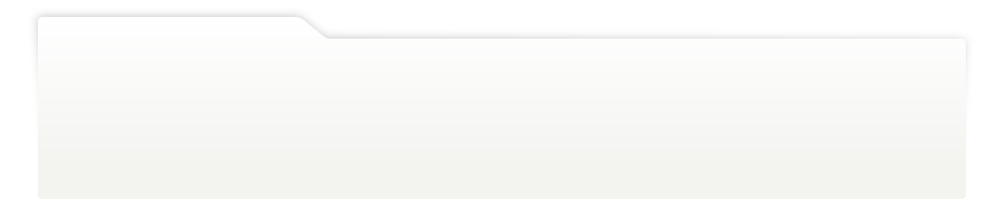
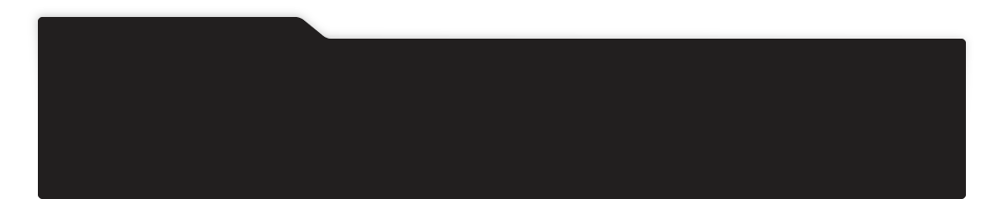
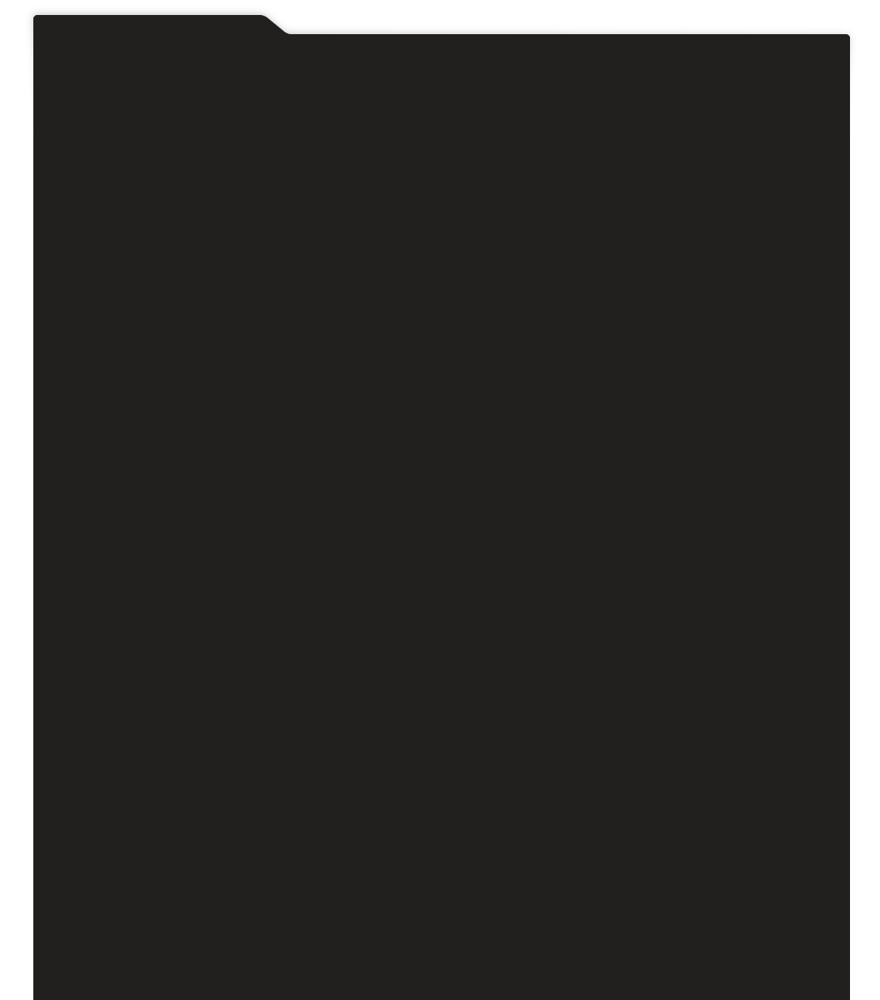
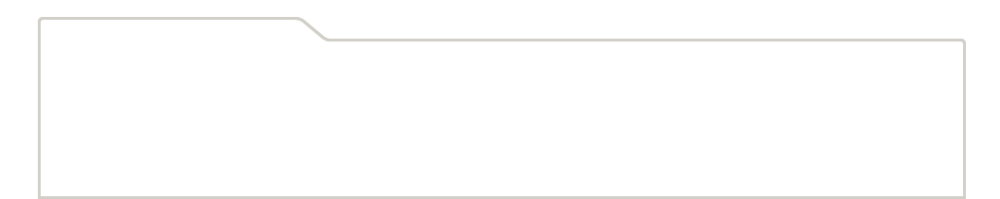
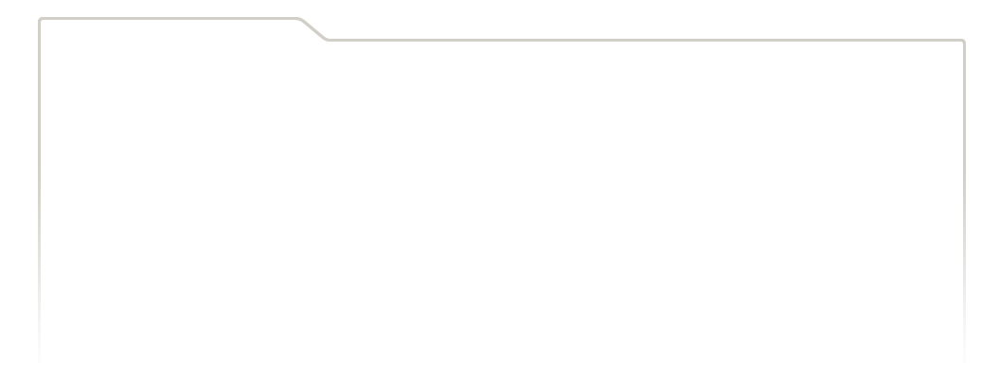
...
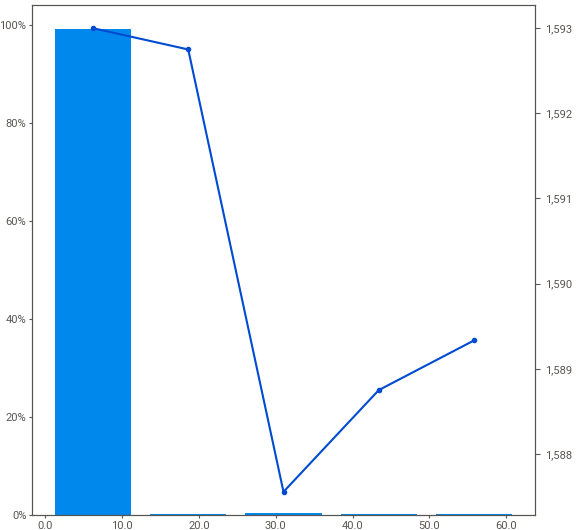
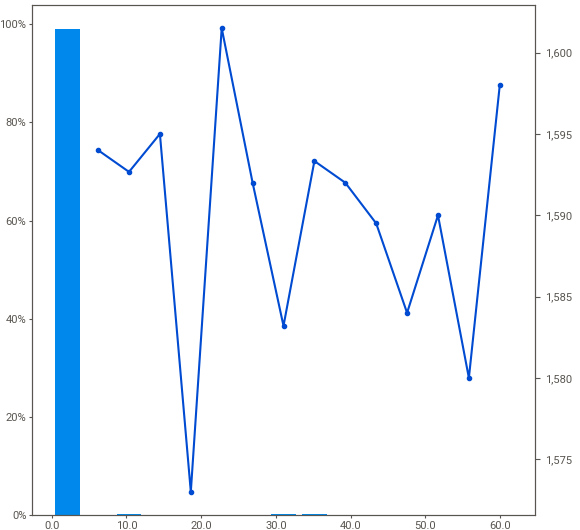
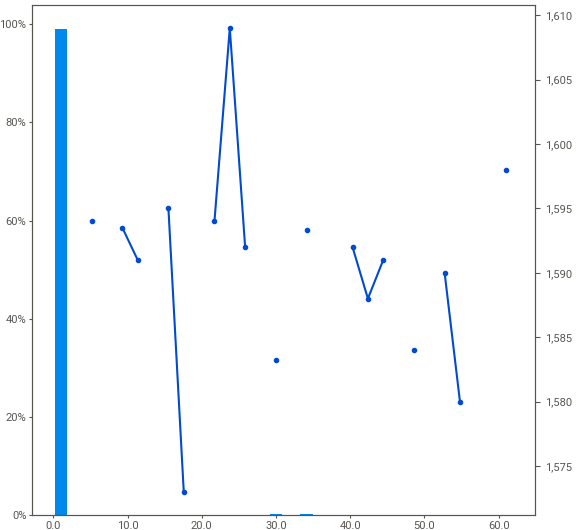
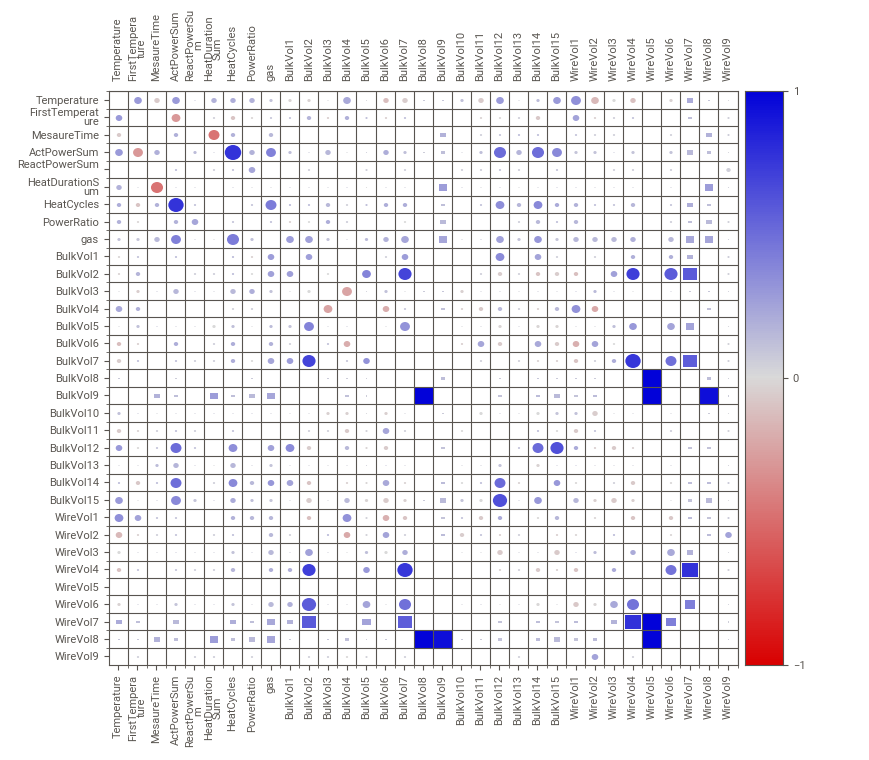
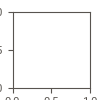

In [24]:
report_initial_steel = sv.analyze(source=(df, "Steel initial"), target_feat="Temperature")
report_initial_steel.show_notebook()


В значениях целевого признака наблюдаются аномально низкие значения температуры, не достаточной для плавления стали и аномально высокие. Вероятно, что эти данные ошибочны и их можно удалить.

In [25]:
q_temp_min = df["Temperature"].quantile(0.05)
q_temp_max = df["Temperature"].quantile(0.95)
df = df.drop(index=df[df["Temperature"] < q_temp_min].index)
df = df.drop(index=df[df["Temperature"] > q_temp_max].index)
df = df.reset_index(drop=True)


Кроме этого можно видеть, что в данных большое количество выбросов, значений, которые отличаются от всех остальных как в большую, так и в меньшую сторону. Поэтому приравняем значения выбросов к медианному значению признака.

In [26]:
for col in df.drop(columns="Temperature").columns:
    median = df[col].median()
    if col in ["ActPowerSum", "ReactPowerSum", "HeatDurationSum", "PowerRatio", "gas", "HeatCycles"]:
        q_min = df[col].quantile(0.01)
        q_max = df[col].quantile(0.98)
        df.loc[df[df[col] < q_min].index, col] = median
        df.loc[df[df[col] > q_max].index, col] = median
    elif ("Vol" in col) and (df[col].quantile(0.95) != 0):
        q_max = df[col].quantile(0.98)
        df.loc[df[df[col] > q_max].index, col] = median
    elif ("Vol" in col) and (df[col].quantile(0.95) == 0):
        q_max = df[col].quantile(0.999)
        df.loc[df[df[col] > q_max].index, col] = median
    elif col == "MesaureTime":
        q_min = df[col].quantile(0.01)
        q_max = df[col].quantile(0.96)
        df.loc[df[df[col] < q_min].index, col] = median
        df.loc[df[df[col] > q_max].index, col] = median
    elif col == "FirstTemperature":
        q_min = df[col].quantile(0.05)
        df.loc[df[df[col] < q_min].index, col] = median


Сгенерируем дополнительные признаки: полную мощность и полную работу.

In [27]:
# полная мощность
df["TotalPowerSum"] = (df["ActPowerSum"] ** 2 + df["ReactPowerSum"] ** 2) ** 0.5

# полная работа
df["TotalWork"] = df["TotalPowerSum"] * df["HeatDurationSum"]


Удалим признаки, которые содержат только нулевые значения.

In [28]:
cols_to_drop = [col for col in df.columns if sum(df[col]) == 0]
df = df.drop(columns=cols_to_drop)


Посмотрим на данные еще раз.

                                             |          | [  0%]   00:00 -> (? left)


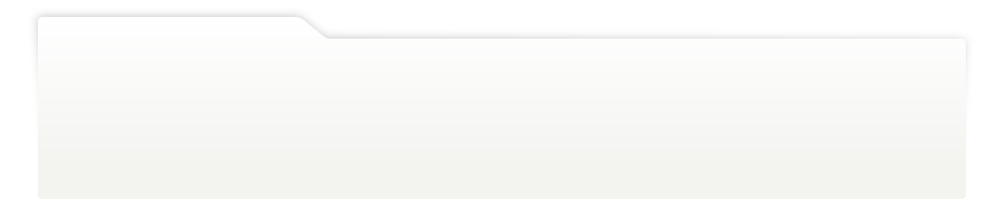
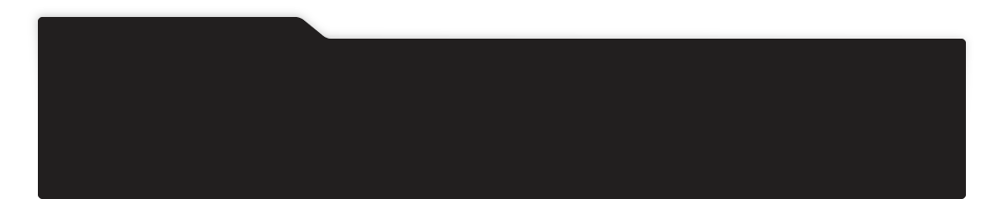
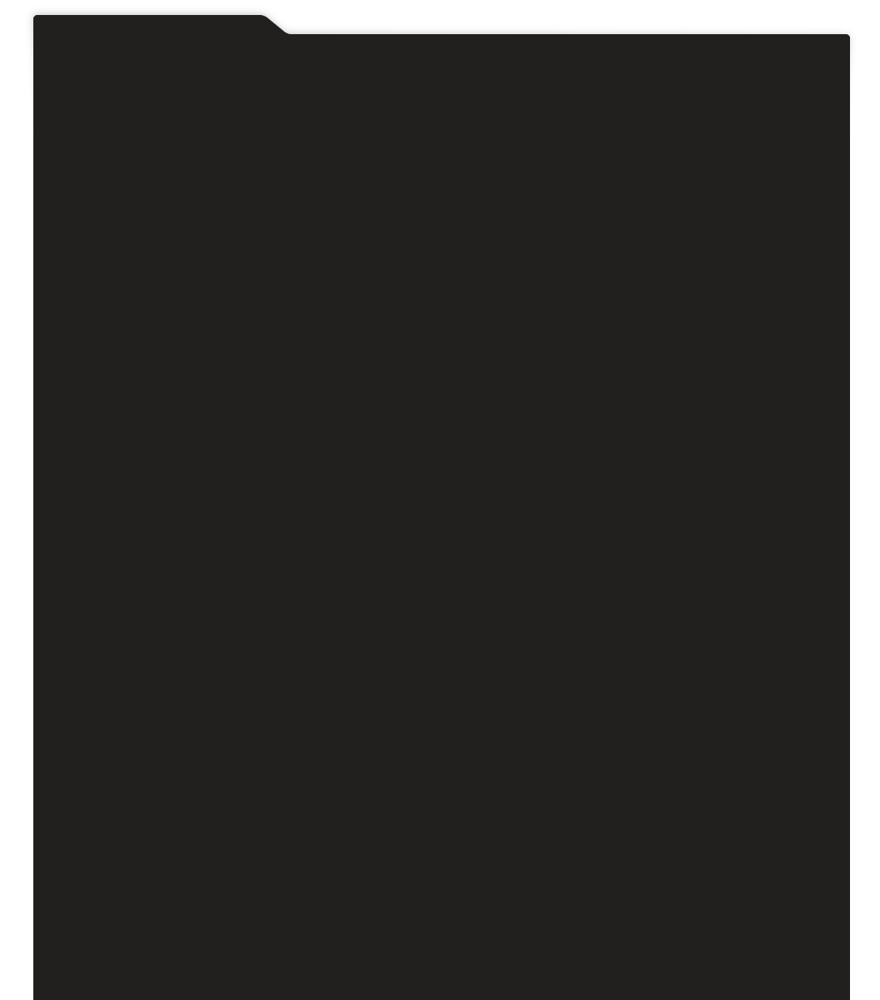
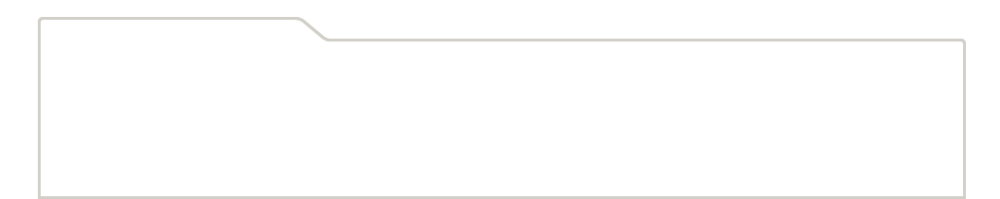
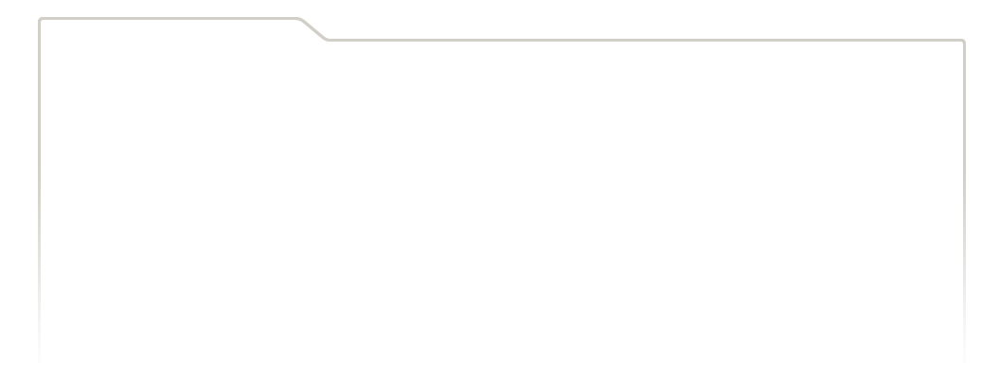
...
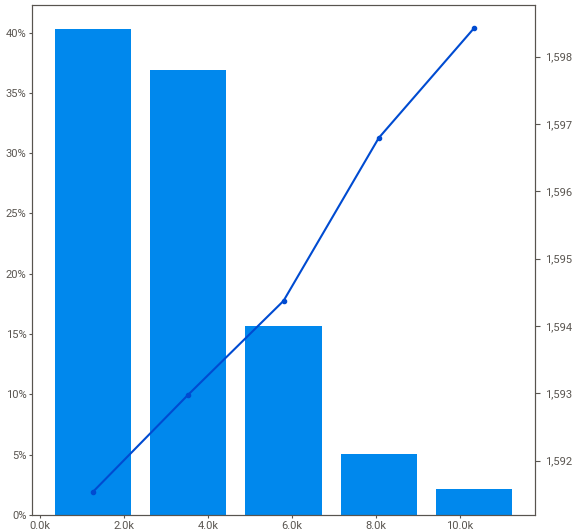
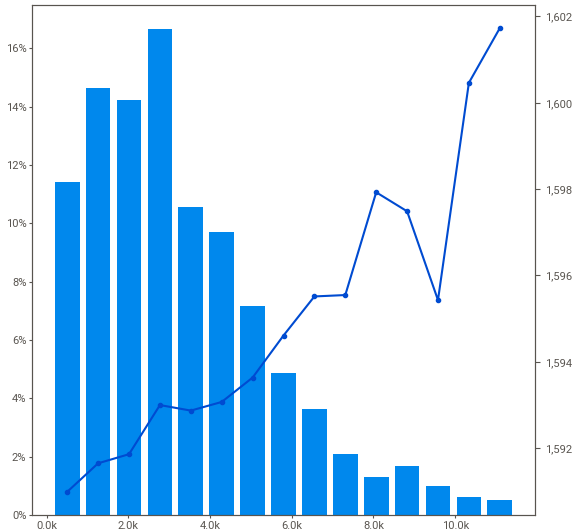
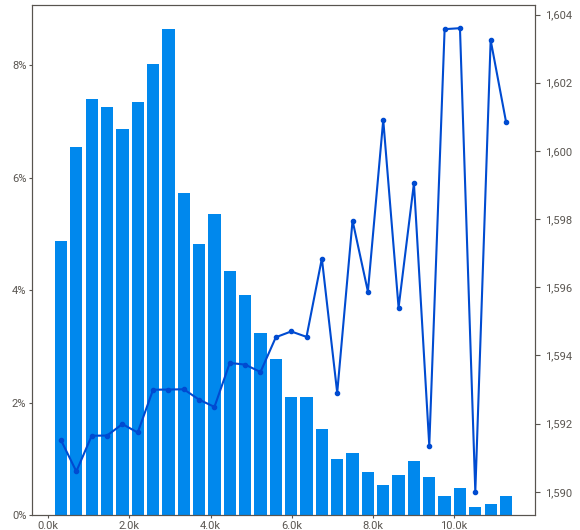
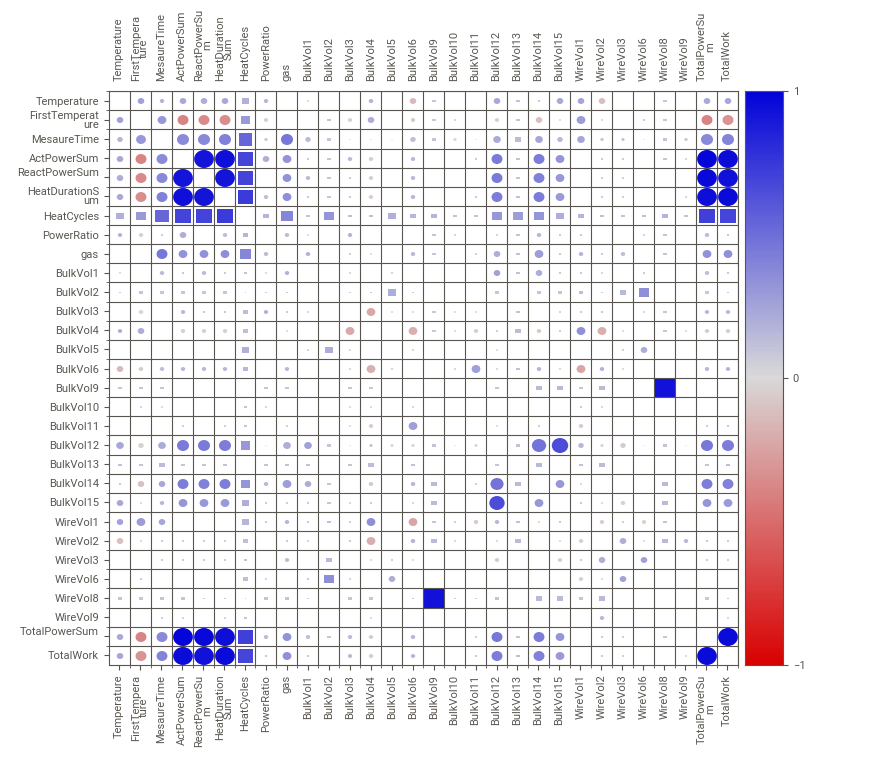
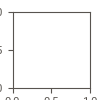

In [29]:
report_cleaning_steel = sv.analyze(source=(df, "Steel after cleaning"), target_feat="Temperature")
report_cleaning_steel.show_notebook()


После обработки данных количество выбросов заметно уменьшилось и стало заметно, что на величину температуры наибольшее влияние оказывает длительность процесса, длительность нагрева и затраченной мощности, а также добавление 4 и 6 типов легирующих элементов в виде порошка и 1 и 2 типов в виде проволоки. Можно видеть, что температура стали и параметры, связанные с её нагревом близки к нормальному распределению.

Проверим Phik корреляцию признаков.

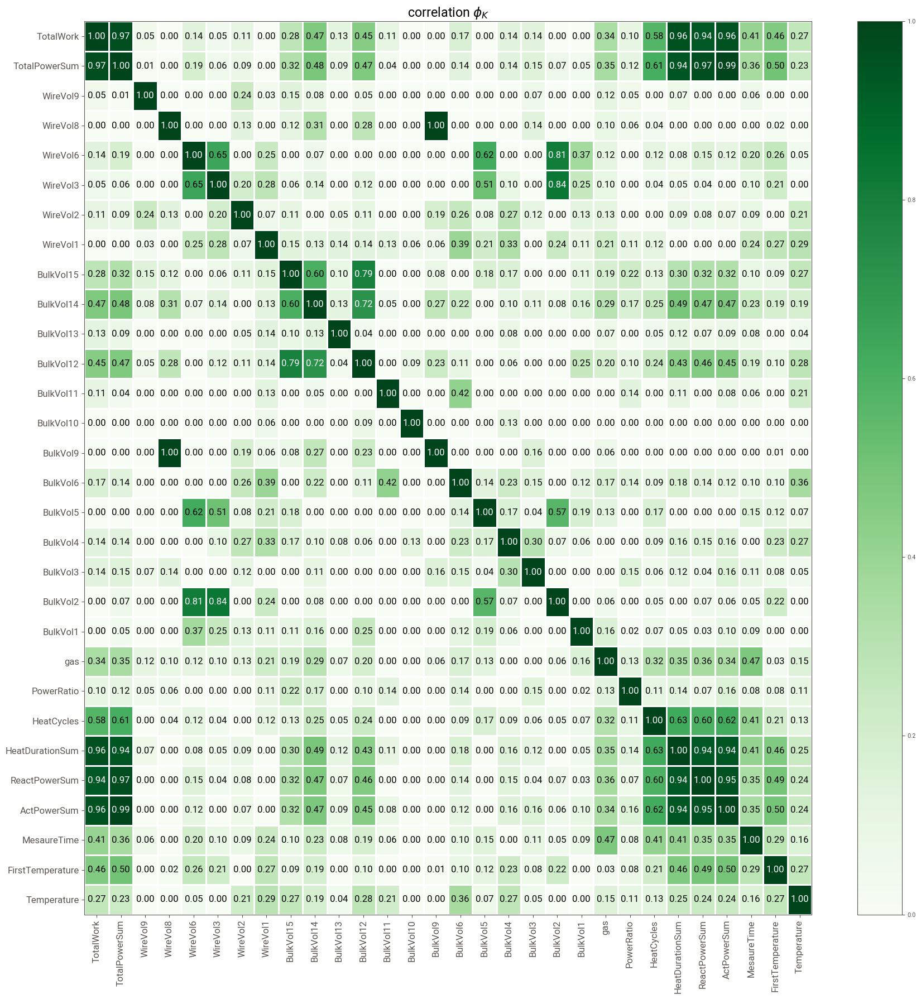

In [30]:
phik_overview = df.phik_matrix(interval_cols=df.columns)

plot_correlation_matrix(phik_overview.values,
                        x_labels=phik_overview.columns,
                        y_labels=phik_overview.index,
                        vmin=0, vmax=1, color_map="Greens",
                        title=r"correlation $\phi_K$",
                        fontsize_factor=1.2,
                        figsize=(18, 18))
plt.tight_layout()


Кроме очевидных корреляций между затраченной мощностью, временем нагрева и новыми сгенерированными признаками, обнаружилась неожиданная корреляция между `WireVol8` и `BulkVol9`, по-видимому, при приготовлении некоторых из сортов стали эти легирующие элементы добавляют вместе. Можно удалить один из этих признаков, например, тот в котором меньше ненулевых данных. Если количество ненулевых значений совпадает, то удалим `BulkVol9`, т.к. данных о легировании сыпучими материалами больше, чем проволочными.

In [31]:
if sum(df["BulkVol9"] != 0) <= sum(df["WireVol8"] != 0):
    df = df.drop(columns="BulkVol9")
else:
    df = df.drop(columns="WireVol8")


## Выбор лучшей модели

In [32]:
X_train, X_test, y_train, y_test = train_test_split(df.drop(columns="Temperature"),
                                                    df["Temperature"],
                                                    test_size=0.2,
                                                    random_state=SEED)

print(f"Размер тренировочного датасета: {X_train.shape}\n"
      f"Размер тестового датасета: {X_test.shape}")


Размер тренировочного датасета: (1676, 28)
Размер тестового датасета: (420, 28)


### Линейная регрессия

In [33]:
SEARCH_HP_LR = False
if SEARCH_HP_LR:
    pipe_lr = Pipeline([("scaler", StandardScaler()),
                        ("lr", Lasso(max_iter=50000))])

    params_lr = {"lr__alpha": [0.0001, 0.001, 0.01, 0.025, 0.05, 0.1, 1, 5, 10, 15, 50, 100],
                 "lr__fit_intercept": [True, False]}

    grid_lr = RandomizedSearchCV(estimator=pipe_lr,
                                 param_distributions=params_lr,
                                 scoring=SCORE,
                                 cv=5,
                                 n_iter=24,
                                 random_state=SEED,
                                 n_jobs=None,
                                 verbose=1)

    grid_lr.fit(X_train, y_train)

    print(f"params_lr = {grid_lr.best_params_}\n"
          f"mae_lr = {-grid_lr.best_score_:.3f}")


params_lr = {'lr__fit_intercept': True, 'lr__alpha': 0.05}
mae_lr = 7.317

### Случайный лес

In [34]:
SEARCH_HP_RF = False
if SEARCH_HP_RF:
    params_rf = {"n_estimators": [100, 200, 300, 400, 500, 600, 700],
                 "max_depth": [3, 4, 5, 6, 7, 8, 9, 10, 20, 50, 100],
                 "min_samples_leaf": [3, 4, 5, 6, 7, 8, 9, 10, 15, 20],
                 "min_samples_split": [2, 3, 4, 5, 6, 7, 8, 9, 10, 15, 20]}

    grid_rf = RandomizedSearchCV(estimator=RandomForestRegressor(random_state=SEED),
                                 param_distributions=params_rf,
                                 scoring=SCORE,
                                 cv=5,
                                 n_iter=N_ITER,
                                 random_state=SEED,
                                 n_jobs=None,
                                 verbose=1)

    grid_rf.fit(X_train, y_train)

    print(f"params_rf = {grid_rf.best_params_}\n"
          f"mae_rf = {-grid_rf.best_score_:.3f}")


params_rf = {'n_estimators': 700, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_depth': 20}
mae_rf = 6.823

### Градиентный бустинг

In [35]:
SEARCH_HP_GB = False
if SEARCH_HP_GB:
    params_gb = {"learning_rate": [0.001, 0.01, 0.1, 0.2, 0.5],
                 "n_estimators": [100, 200, 300, 400, 500, 600, 700],
                 "max_depth": [3, 4, 5, 6, 7, 8, 9, 10, 20, 50, 100],
                 "min_samples_leaf": [3, 4, 5, 6, 7, 8, 9, 10, 15, 20],
                 "min_samples_split": [2, 3, 4, 5, 6, 7, 8, 9, 10, 15, 20]}

    grid_gb = RandomizedSearchCV(estimator=GradientBoostingRegressor(random_state=SEED),
                                 param_distributions=params_gb,
                                 scoring=SCORE,
                                 cv=5,
                                 n_iter=N_ITER,
                                 random_state=SEED,
                                 n_jobs=None,
                                 verbose=1)

    grid_gb.fit(X_train, y_train)

    print(f"params_gb = {grid_gb.best_params_}\n"
          f"mae_gb = {-grid_gb.best_score_:.3f}")


params_gb = {'n_estimators': 300, 'min_samples_split': 10, 'min_samples_leaf': 20, 'max_depth': 100, 'learning_rate': 0.01}
mae_gb = 6.757

### Полносвязная нейронная сеть

In [36]:
SEARCH_HP_MLP = False
if SEARCH_HP_MLP:
    pipe_mlp = Pipeline([("scaler", StandardScaler()),
                         ("mlp", MLPRegressor(max_iter=5000, random_state=SEED))])

    num_n = X_train.shape[1]

    params_mlp = {"mlp__hidden_layer_sizes": [(num_n,), (num_n * 2,), (num_n // 2,),
                                              (num_n,num_n,), (num_n * 2,num_n * 2,), (num_n // 2,num_n // 2,),
                                              (num_n,num_n * 2,), (num_n,num_n // 2,), (num_n * 2,num_n // 2,),
                                              (num_n,num_n,num_n,), (num_n * 2,num_n * 2,num_n * 2,),
                                              (num_n // 2,num_n // 2,num_n // 2,), (num_n,num_n // 2,num_n,),
                                              (num_n,num_n * 2,num_n,), (num_n * 2,num_n,num_n // 2,)],
                  "mlp__activation": ["relu"],
                  "mlp__alpha": [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0, 10000.0],
                  "mlp__learning_rate_init": [0.0001, 0.001, 0.01, 0.1, 0.5]}

    grid_mlp = RandomizedSearchCV(estimator=pipe_mlp,
                                  param_distributions=params_mlp,
                                  scoring=SCORE,
                                  cv=5,
                                  n_iter=N_ITER,
                                  random_state=SEED,
                                  n_jobs=None,
                                  verbose=1)

    grid_mlp.fit(X_train, y_train)

    print(f"params_mlp = {grid_mlp.best_params_}\n"
          f"mae_mlp = {-grid_mlp.best_score_:.3f}")


params_mlp = {'mlp__learning_rate_init': 0.5, 'mlp__hidden_layer_sizes': (64, 64, 64), 'mlp__alpha': 0.0001, 'mlp__activation': 'relu'}
mae_mlp = 8.577

Наименьшей величиной метрики обладает модель градиентного бустинга.

## Обучение модели и важность признаков

Обучим и протестируем модель с найденными гиперпараметрами.

In [37]:
params_gb = {'n_estimators': 300, 'min_samples_split': 10,
             'min_samples_leaf': 20, 'max_depth': 100,
             'learning_rate': 0.01}

gb = GradientBoostingRegressor(random_state=SEED, **params_gb)
gb.fit(X_train, y_train)

y_predict = gb.predict(X_test)

print(f"mae_gb_test = {mean_absolute_error(y_test, y_predict):.3f}")


mae_gb_test = 5.282


Оценим важность признаков с помощью SHAP.

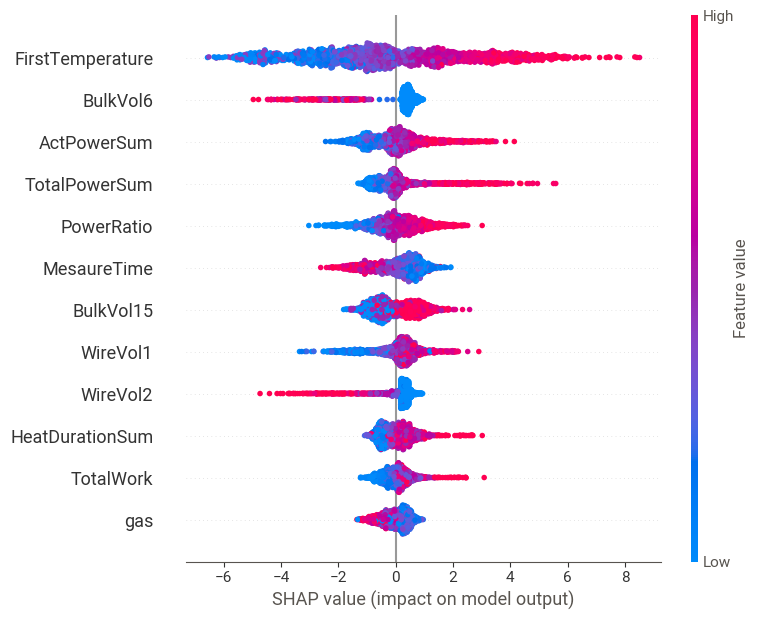

In [38]:
shap_gb = shap.TreeExplainer(gb).shap_values(X_train)
shap.summary_plot(shap_gb, X_train, plot_size='auto', max_display=12)


Проанализируем влияние отношения активной и реактивной мощностей на целевой признак.

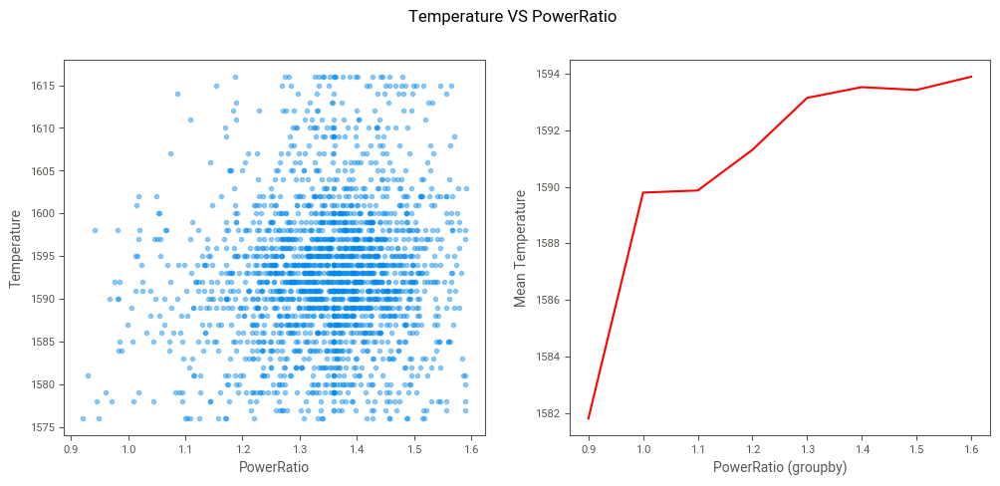

In [39]:
df_power_ratio = df.loc[:, ["PowerRatio", "Temperature"]]
df_power_ratio["PowerRatio"] = df_power_ratio["PowerRatio"].round(1)
df_power_ratio_agg = df_power_ratio.groupby("PowerRatio")["Temperature"].mean()
df_power_ratio_agg = df_power_ratio_agg.reset_index()

fig, ax = plt.subplots(1, 2, figsize=(12,5))
ax[0].scatter(df["PowerRatio"], df["Temperature"], alpha=0.4)
ax[1].plot(df_power_ratio_agg["PowerRatio"], df_power_ratio_agg["Temperature"], color="red")

fig.suptitle("Temperature VS PowerRatio")
ax[0].set_xlabel("PowerRatio")
ax[0].set_ylabel("Temperature")
ax[1].set_xlabel("PowerRatio (groupby)")
ax[1].set_ylabel("Mean Temperature")
plt.show()


Можно видеть, что наибольшее влияние на температуру стали оказывают: первая замеренная температура, затраченная электрическая мощность, использование легирующего элемента 15 типа в виде порошка и 2 типа в виде проволоки, а также отношение активной электрической мощности к реактивной. Интересно отметить, что максимум средней температуры стали достигается при соотношении мощностей от 1.3 до 1.5, по-видимому, сталь при такой температуре обладает минимальными индуктивными свойствами, которые увеличивают уровень затраченной реактивной мощности.